In [25]:
import os

import numpy as np
import pandas as pd
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
import simplstyles
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper

In [26]:
from results import get_result_path

In [27]:
plt.style.use('nord-light-talk')
# mpl.use('QtAgg')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

/home/leo/PycharmProjects/compare_variance_residual/venv/lib/python3.12/site-packages/himalaya/backend/_utils.py:55: UserWarning: Setting backend to torch_cuda failed: PyTorch not installed..Falling back to numpy backend.
  warnings.warn(f"Setting backend to {backend} failed: {str(error)}."


RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [28]:
modality = "reading"
subject = 5
low_level_feature = "moten"

In [29]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
flatmap_mask = load_hdf5_array(mapper_path, key='flatmap_mask')

# Load EV

In [30]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80249.000000
mean,0.058670
std,0.097017
min,-0.289520
25%,-0.006331
50%,0.046185
75%,0.108376
max,0.622027


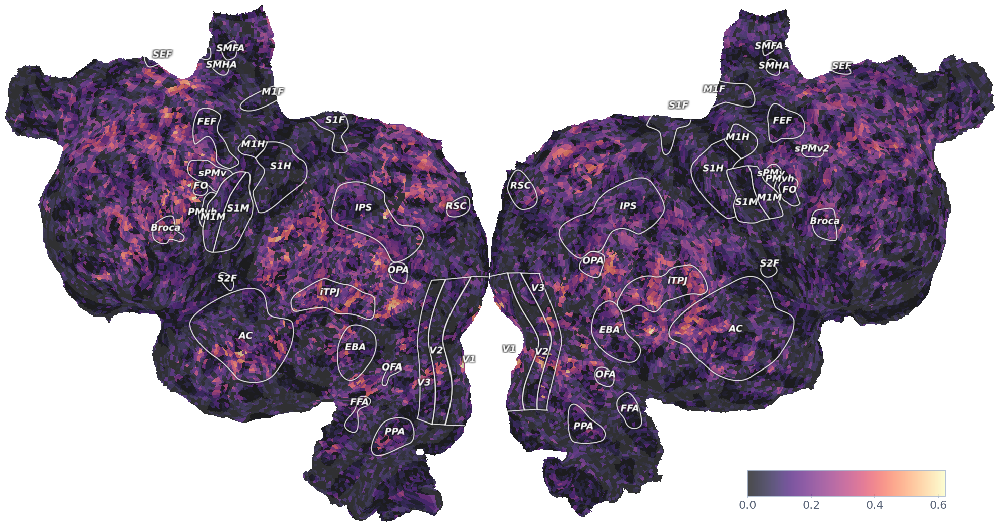

In [31]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Variance Partitioning

## Low Level Prediction

In [32]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [33]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/reading/subject05/moten_scores.csv


,correlation_score,r2_score,p_value
count,80249.000000,80615.000000,8.024900e+04
mean,0.031031,0.001744,4.309444e-01
std,0.080017,0.014597,3.082949e-01
min,-0.232842,-0.165027,9.782314e-38
25%,-0.020478,-0.000226,1.452430e-01
50%,0.024922,0.000000,4.082378e-01
75%,0.073089,0.001060,6.966325e-01
max,0.659753,0.402436,9.999905e-01


In [34]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

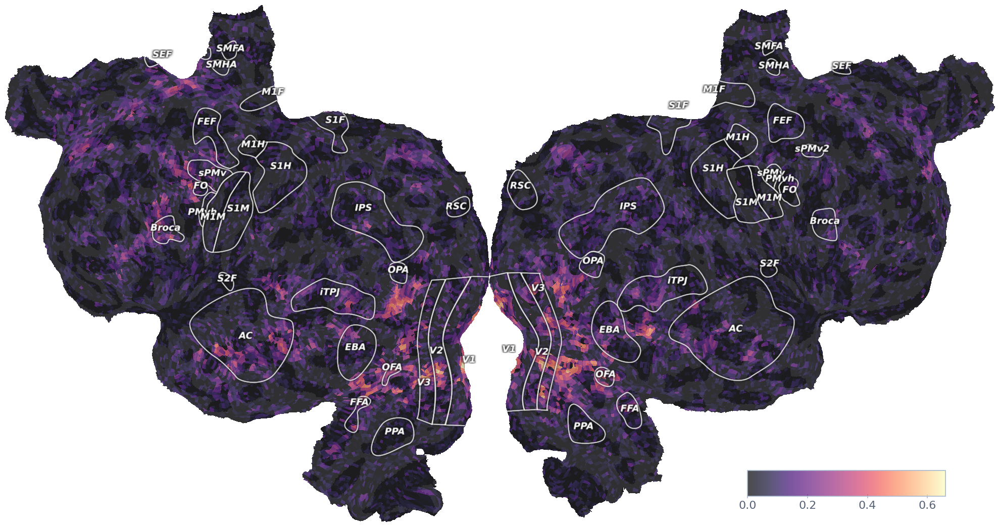

In [35]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [36]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [37]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,80615.000000,8.024900e+04
mean,0.051920,0.006862,3.892247e-01
std,0.097892,0.023713,3.181796e-01
min,-0.374429,-0.117347,4.071945e-28
25%,-0.012467,-0.000329,7.823767e-02
50%,0.036160,0.000000,3.448302e-01
75%,0.096228,0.004640,6.644945e-01
max,0.585031,0.328594,9.999997e-01


In [38]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

significant_voxels = [True if p_value < 0.05 else False for p_value in semantic_scores['p_value']]
masked_correlation = np.full(semantic_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = semantic_correlation[significant_voxels]

0.5850312724901918


<Axes: >

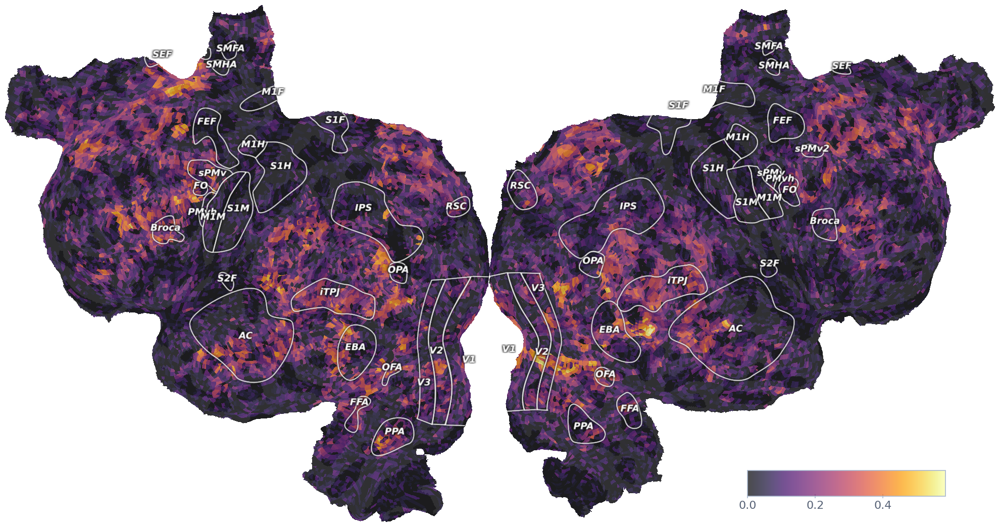

In [39]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05])


## Joint Prediction

In [40]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [41]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,80615.000000,8.024900e+04
mean,0.054245,0.006914,3.822356e-01
std,0.097624,0.026181,3.163574e-01
min,-0.262070,-0.113007,2.588210e-36
25%,-0.009320,-0.000842,7.498688e-02
50%,0.039886,0.000107,3.323885e-01
75%,0.098301,0.005583,6.522190e-01
max,0.649912,0.420401,9.999675e-01


In [42]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

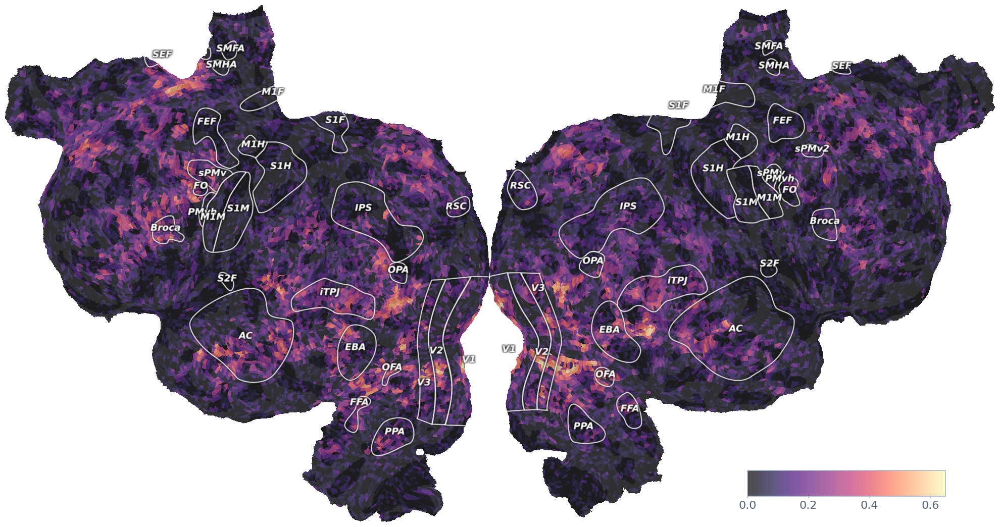

In [43]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

In [44]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [45]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic\moten,joint\moten,semantic\moten_r2,joint\moten_r2
count,80615.000000,80615.000000,80615.000000,8.061500e+04
mean,0.046820,0.046820,0.001691,5.170629e-03
std,0.067766,0.067766,0.010647,1.749400e-02
min,0.000000,0.000000,-0.084019,-9.613419e-02
25%,0.000000,0.000000,-0.000769,-1.668930e-06
50%,0.015160,0.015160,0.000000,2.384000e-07
75%,0.071187,0.071187,0.001610,4.592746e-03
max,0.509586,0.509586,0.229324,2.566591e-01


In [46]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level

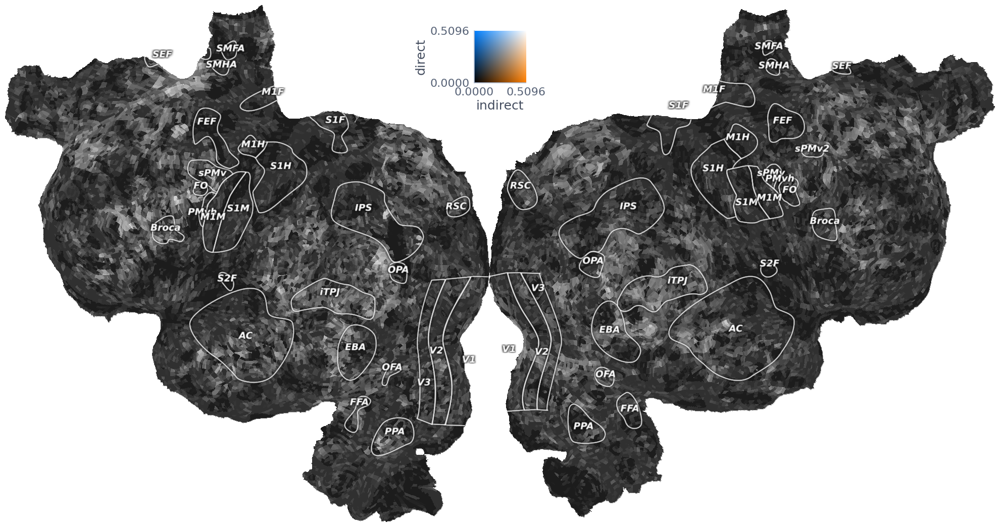

In [47]:
indirect = vp_scores[f'semantic\\{low_level_feature}']
direct = vp_scores[f'joint\\{low_level_feature}']
vmax = max(indirect.max(), direct.max())

plot_2d_flatmap_from_mapper(indirect, direct, mapper_path, vmin=0, vmin2=0, vmax=vmax, vmax2=vmax, label_1="indirect", label_2='direct')
plt.show()

# Residual Method

In [48]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")

In [49]:
r2_scores = pd.read_csv(cross_path)

<Axes: ylabel='Count'>

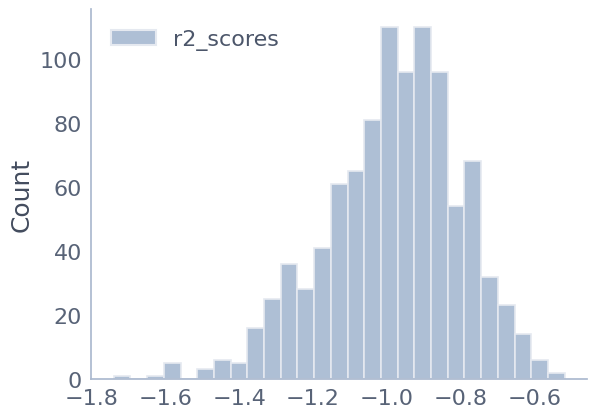

In [50]:
sns.histplot(r2_scores)

In [51]:
cross_ridge_path = os.path.join(get_result_path(modality, subject), f"cross_ridge_{low_level_feature}_english1000_scores.csv")

<Axes: ylabel='Count'>

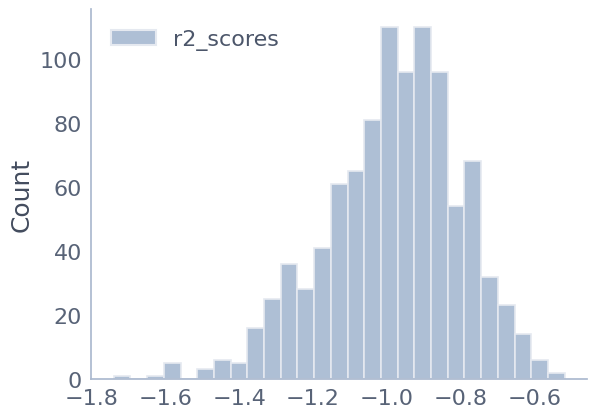

In [52]:
r2_scores = pd.read_csv(cross_path)
sns.histplot(r2_scores)

## Residuals

### OLS

In [53]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [54]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80249.000000,80615.000000,8.024900e+04
mean,40307.000000,0.037018,-0.005399,4.156941e-01
std,23271.690312,0.077820,0.027825,3.111653e-01
min,0.000000,-0.266421,-0.463045,3.296684e-15
25%,20153.500000,-0.015326,-0.004100,1.225192e-01
50%,40307.000000,0.030627,0.000000,3.832208e-01
75%,60460.500000,0.081866,0.000343,6.846998e-01
max,80614.000000,0.440002,0.173534,9.999831e-01


In [55]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

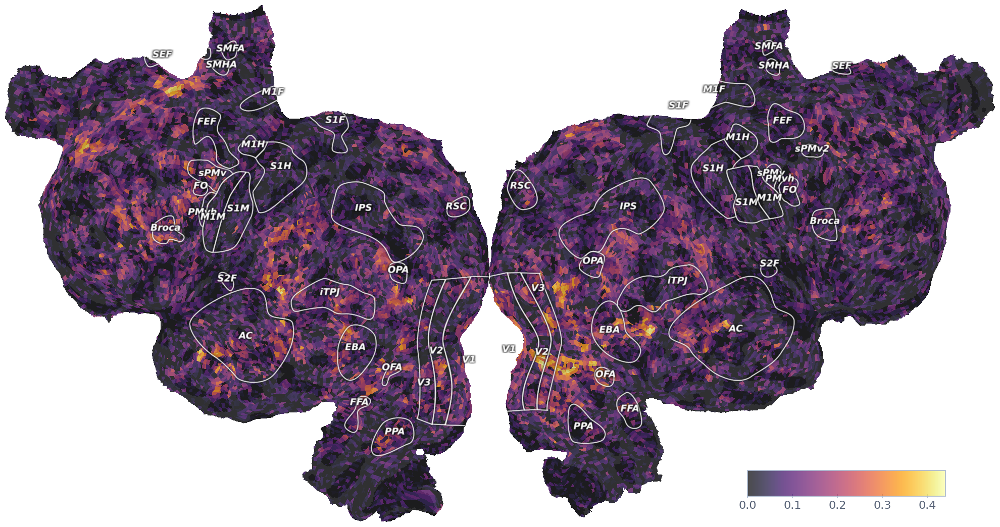

In [56]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

### Ridge

In [57]:
residual_ridge_file = os.path.join(get_result_path(modality, subject),
                                   f"residual_ridge_{low_level_feature}_english1000_scores.csv")

In [58]:
residual_ridge_scores = pd.read_csv(residual_ridge_file)
residual_ridge_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80249.000000,80615.000000,8.024900e+04
mean,40307.000000,0.051751,0.006814,3.890563e-01
std,23271.690312,0.097790,0.023636,3.181295e-01
min,0.000000,-0.379531,-0.118241,7.047058e-28
25%,20153.500000,-0.012595,-0.000334,7.863561e-02
50%,40307.000000,0.036101,0.000000,3.436037e-01
75%,60460.500000,0.096155,0.004623,6.638742e-01
max,80614.000000,0.582904,0.328609,9.999993e-01


In [59]:
residual_ridge_correlation = residual_ridge_scores['correlation_score']
residual_ridge_correlation = residual_ridge_correlation.to_numpy()
residual_ridge_correlation = np.nan_to_num(residual_ridge_correlation)

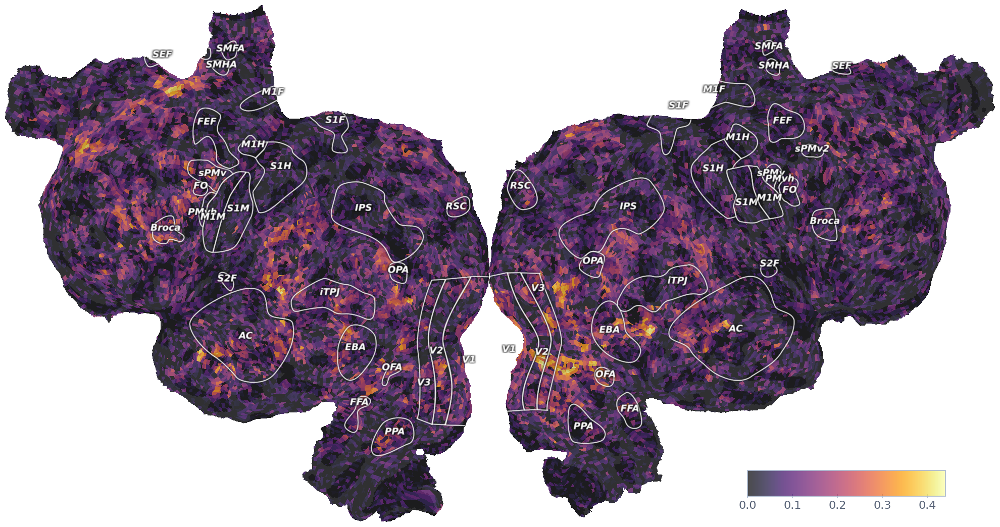

In [60]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

13


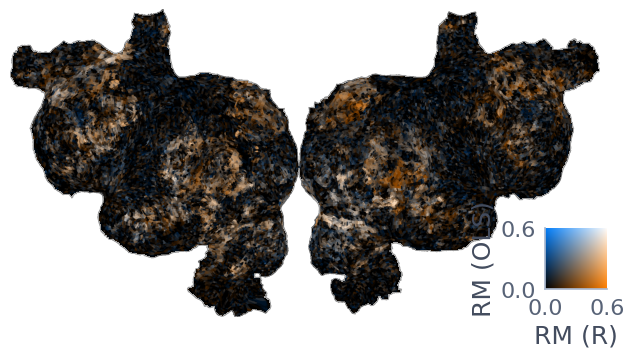

In [70]:
from matplotlib.ticker import StrMethodFormatter, FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(residual_ridge_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(residual_ridge_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='RM (R)', label_2="RM (OLS)", ax=ax, with_rois=False, colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

13


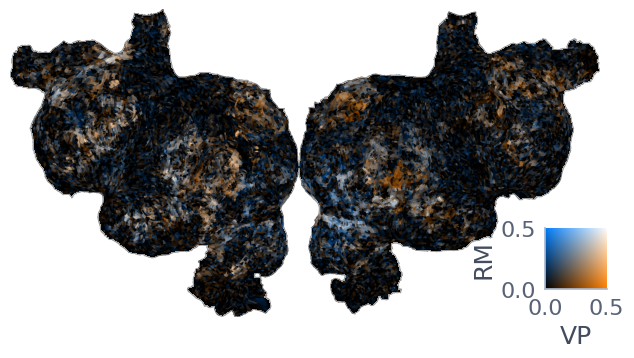

In [62]:
from matplotlib.ticker import StrMethodFormatter, FormatStrFormatter

fig, ax = plt.subplots(1, 1, figsize=(8, 4))

ax.axis('off')

vmin = 0
vmax = max(vp_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(vp_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='VP', label_2="RM", ax=ax, with_rois=False, colorbar_location=[0.86, 0.09, 0.2, 0.2])
# get child axis
children = ax.get_children()
print(len(children))
cbar = children[11]
# set formatter
cbar.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
cbar.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Plot visual cortex side by side

/tmp/ipykernel_11693/2779319318.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


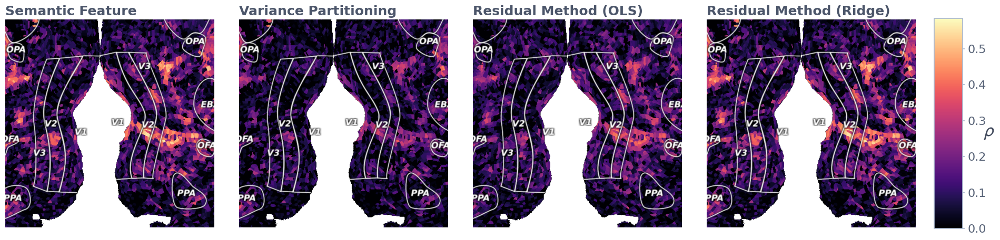

In [63]:
viewport_size = 450
fig, axs = plt.subplots(1, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(), residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

for i, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation, residual_ridge_correlation],
                                     ["Semantic Feature", "Variance Partitioning", "Residual Method (OLS)", "Residual Method (Ridge)"])):
    ax = axs[i]
    ax.axis('off')
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_11693/3536933144.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


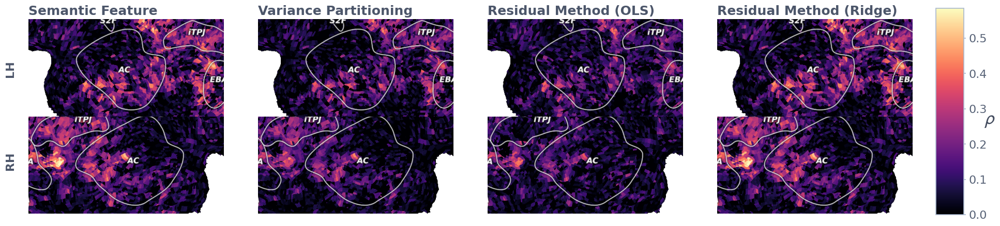

In [64]:
viewport_size = 450
fig, axs = plt.subplots(2, 4, figsize=(viewport_size / 100 * 4, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max(), residual_ridge_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation, residual_ridge_correlation],
                                           ["Semantic Feature", "Variance Partitioning", "Residual Method (OLS)", "Residual Method (Ridge)"])):
        ax = axs[row, col]

        ax.axis('off')
        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()

# Scatterplot of visual cortex

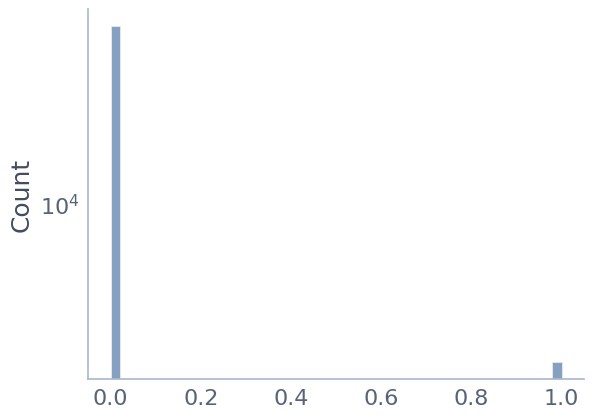

In [65]:
mapper = load_hdf5_array(mapper_path)
v1_mask = mapper['roi_mask_V1']
v2_mask = mapper['roi_mask_V2']
v3_mask = mapper['roi_mask_V3']
all_masks = v1_mask + v2_mask + v3_mask
# set all values > 0 to 1
all_masks[all_masks > 0] = 1
all_masks = all_masks.astype(bool)

sns.histplot(all_masks, kde=False, bins=50)
plt.yscale('log')

<Axes: >

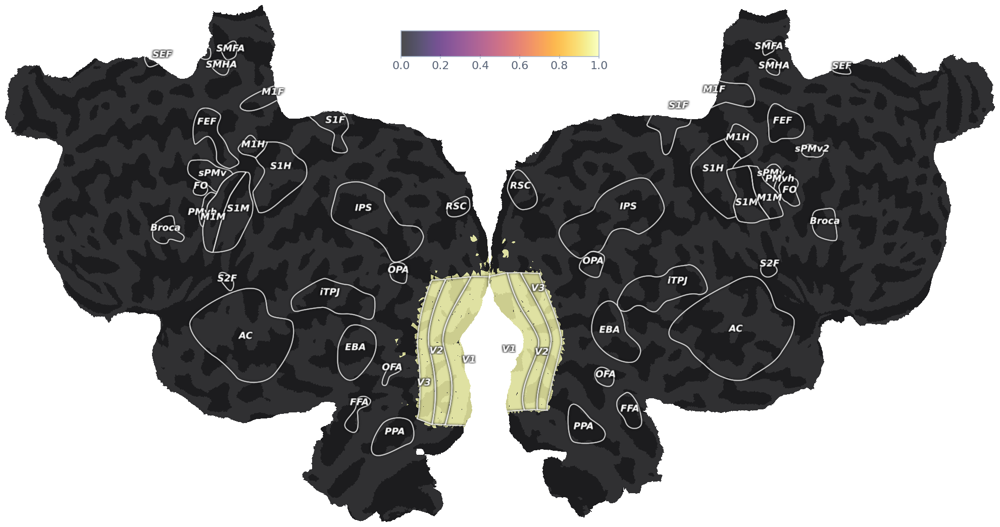

In [66]:
plot_flatmap_from_mapper(all_masks, mapper_path, vmin=0, vmax=all_masks.max())

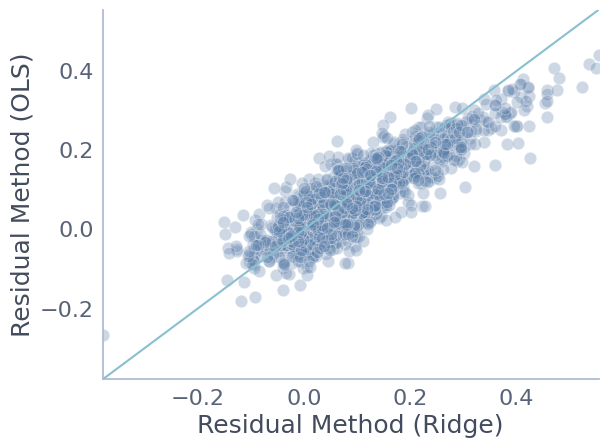

In [67]:
visual_rm = residual_correlation[all_masks]
visual_rm_ridge = residual_ridge_correlation[all_masks]
sns.scatterplot(x=visual_rm_ridge, y = visual_rm, alpha=0.3)
# sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, fill=True, alpha=0.6, cmap='magma')

plt.xlabel("Residual Method (Ridge)")
plt.ylabel("Residual Method (OLS)")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
max_lims = max(visual_rm.max(), visual_rm_ridge.max())
min_lims = min(visual_rm.min(), visual_rm_ridge.min())
plt.xlim([min_lims, max_lims])
plt.ylim([min_lims, max_lims])
plt.plot([min_lims, max_lims], [min_lims, max_lims], color='C1')

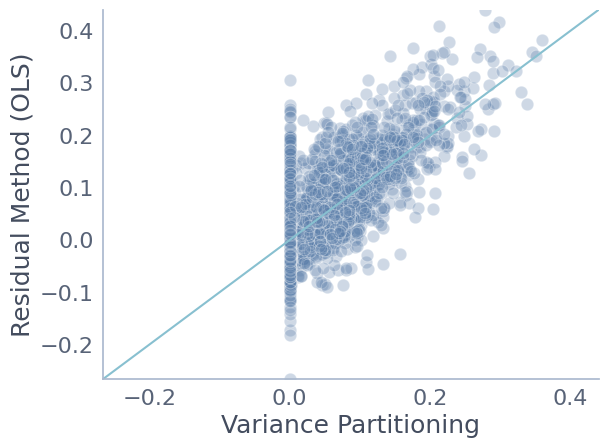

In [68]:
visual_vp = vp_correlation[all_masks]
visual_rm = residual_correlation[all_masks]
sns.scatterplot(x=visual_vp, y = visual_rm, alpha=0.3)
# sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, color="C2")

plt.xlabel("Variance Partitioning")
plt.ylabel("Residual Method (OLS)")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
max_lims = max(visual_rm.max(), visual_vp.max())
min_lims = min(visual_rm.min(), visual_vp.min())
plt.xlim([min_lims, max_lims])
plt.ylim([min_lims, max_lims])
plt.plot([min_lims, max_lims], [min_lims, max_lims], color='C1')

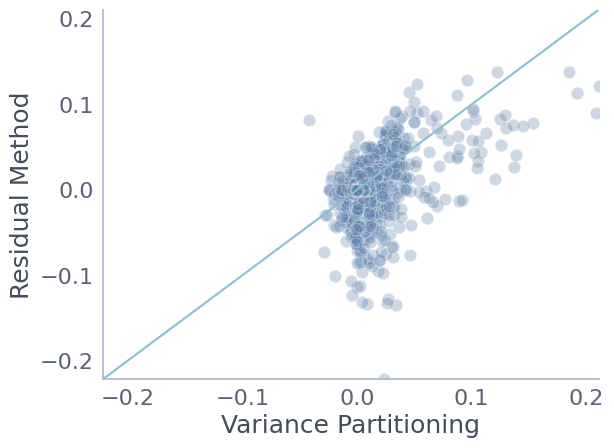

In [69]:
visual_vp = np.nan_to_num(vp_scores[f'semantic\\{low_level_feature}_r2'])[all_masks]
visual_rm = np.nan_to_num(residual_scores['r2_score'])[all_masks]

sns.scatterplot(x=visual_vp, y = visual_rm, alpha=0.3)
# sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, fill=True, alpha=0.6, cmap='magma')

plt.xlabel("Variance Partitioning")
plt.ylabel("Residual Method")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
max_lims = max(visual_rm.max(), visual_vp.max())
min_lims = min(visual_rm.min(), visual_vp.min())
plt.xlim([min_lims, max_lims])
plt.ylim([min_lims, max_lims])
plt.plot([min_lims, max_lims], [min_lims, max_lims], color='C1')